# CSI Main Dataset Analysis: Controlled Multi-Position Presence Detection
**Project:** Device-Free Wi-Fi Sensing with CSI on ESP32-S3  
**Author:** Warley Xavier  
**Course:** PFC I - Control and Automation Engineering - UFMG 2026/2  
**Dataset:** Main Campaign (`data/01_raw/main/` - Sessions G through M)  

---

> **Purpose of this notebook:** Conduct an exhaustive exploratory data analysis (EDA) of the main experimental collection campaign (`data/01_raw/main/`), validating data integrity, link stability, OFDM subcarrier dynamics, and physical presence discriminability across multiple spatial positions.
>
> **Campaign Overview:**
> The main campaign comprises **7 sessions** collected in a residential bedroom environment (3.40 m × 3.45 m × 2.85 m) using two ESP32-S3 nodes (TX: STA, RX: AP) configured for ESP-NOW 802.11n HT40 (40 MHz bandwidth, Channel 11, 192 subcarriers, 30 Hz nominal rate):
> - **3 Empty baseline sessions:** Session G (initial 11.5 min), Session J (extended 31.5 min), and Session L (repeat baseline 11.5 min), allowing evaluation of both short-term and multi-hour environmental/thermal stability.
> - **4 Occupied-still sessions testing spatial diversity:**
>   - **P1 (`occupied_p1_still`, Session H):** Motionless subject standing approx. 30 cm off the Line-of-Sight (LoS) to the West.
>   - **P2 (`occupied_p2_still`, Session I):** Motionless subject standing on the LoS, approx. 30 cm from the TX node (strong direct path shadowing).
>   - **P3 (`occupied_p3_still`, Session K):** Motionless subject standing on the LoS, approx. 30 cm from the RX node (strong direct path shadowing).
>   - **P4 (`occupied_p4_still`, Session M):** Motionless subject standing approx. 30 cm off the LoS to the East.
>
> **Key Quality Criteria:** Packet loss < 5%, effective rate within ±10% of 30 Hz, RSSI standard deviation < 5 dBm, and ≥ 40 valid subcarriers.

## Cell 1 - Configuration

Imports required libraries, sets publication-quality Matplotlib styling, resolves repository and data paths, and defines session metadata.

In [1]:
import os, json, warnings
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import matplotlib.dates as mdates
from matplotlib.colors import LogNorm
from pathlib import Path
from datetime import datetime
from scipy import signal as sp_signal
from scipy.stats import kurtosis as scipy_kurtosis

warnings.filterwarnings("ignore")
matplotlib.rcParams.update({
    "figure.dpi": 150,
    "font.family": "DejaVu Sans",
    "axes.grid": True,
    "grid.alpha": 0.35,
    "axes.spines.top": False,
    "axes.spines.right": False,
})

# -------------------------------------------------------------------
# PATHS AND REPO SETUP
# -------------------------------------------------------------------

# Locate repo root regardless of where Jupyter was launched from
_p = Path.cwd()
for PROJECT_ROOT in [_p, _p.parent, _p.parent.parent]:
    if (PROJECT_ROOT / 'requirements.txt').exists():
        break

DATA_DIR   = PROJECT_ROOT / 'data' / '01_raw' / 'main'
OUTPUT_DIR = PROJECT_ROOT / 'outputs' / 'main'
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
DPI = 200

# Nominal TX ICMP rate (Hz) - fallback if JSON is unavailable
NOMINAL_RATE_HZ = 30

# Session file registry for the main campaign
SESSION_FILES = {
    "G": "session_G_empty_20260922_1701.csv",
    "H": "session_H_occupied_p1_still_20260922_1908.csv",
    "I": "session_I_occupied_p2_still_20260922_1932.csv",
    "J": "session_J_empty_20260922_2000.csv",
    "K": "session_K_occupied_p3_still_20260922_2351.csv",
    "L": "session_L_empty_20260923_0009.csv",
    "M": "session_M_occupied_p4_still_20260923_0026.csv",
}

# Color palette mapped by condition / position
LABEL_COLORS = {
    "empty":             "#2196F3",   # Blue
    "occupied_p1_still": "#4CAF50",   # Green (Off-LoS West)
    "occupied_p2_still": "#E91E63",   # Pink/Magenta (On-LoS near TX)
    "occupied_p3_still": "#9C27B0",   # Purple (On-LoS near RX)
    "occupied_p4_still": "#FF9800",   # Orange (Off-LoS East)
    "occupied_still":    "#F44336",   # Red fallback
}

print(f"Project Root : {PROJECT_ROOT.resolve()}")
print(f"Data Dir     : {DATA_DIR.resolve()}")
print(f"Output Dir   : {OUTPUT_DIR.resolve()}")
print(f"Sessions registered: {len(SESSION_FILES)}")
for sid, fname in SESSION_FILES.items():
    fpath = DATA_DIR / fname
    status = "[OK]" if fpath.exists() else "[MISSING]"
    print(f"  {status} Session {sid}: {fname}")

Project Root : /home/xavier/dev/wifi-csi-presence-detection
Data Dir     : /home/xavier/dev/wifi-csi-presence-detection/data/main
Output Dir   : /home/xavier/dev/wifi-csi-presence-detection/outputs/main
Sessions registered: 7
  [OK] Session G: session_G_empty_20260922_1701.csv
  [OK] Session H: session_H_occupied_p1_still_20260922_1908.csv
  [OK] Session I: session_I_occupied_p2_still_20260922_1932.csv
  [OK] Session J: session_J_empty_20260922_2000.csv
  [OK] Session K: session_K_occupied_p3_still_20260922_2351.csv
  [OK] Session L: session_L_empty_20260923_0009.csv
  [OK] Session M: session_M_occupied_p4_still_20260923_0026.csv


## Cell 2 - Parsing and Loading Functions

Defines robust parsing routines for the ESP32-S3 CSI frames:
- Conversion of `timestamp_host` to tz-naive `pandas.Timestamp`.
- Parsing of ISO-8601 condition windows `[t1, t2]`, with automated handling of midnight-crossing timestamps.
- CSI payload string parsing into complex array $H = I + jQ$.
- Amplitude and phase decomposition.
- Valid subcarrier mask calculation (mean amplitude $> 0.5$, discarding guard bands and DC null).
- Automatic discovery and parsing of companion `*_meta.json` files.

In [2]:
# --- Timestamp helpers -------------------------------------------------------

TS_HOST_FMT = "%Y%m%dT%H%M%S.%f"   # Format generated by csi_collector_v2

def parse_ts_host(s: str) -> pd.Timestamp:
    '''Convert a timestamp_host string to a tz-naive pandas Timestamp.'''
    return pd.to_datetime(s, format=TS_HOST_FMT)

def iso_to_ts(s: str) -> pd.Timestamp:
    '''Convert an ISO-8601 string (possibly with tz offset) to tz-naive Timestamp.'''
    ts = pd.Timestamp(s)
    return ts.tz_localize(None) if ts.tzinfo is None else ts.tz_convert(None)

# --- CSI parsing -------------------------------------------------------------

def parse_csi_array(data_str: str):
    '''Parse JSON string array of signed int8 into a numpy array.'''
    try:
        return np.array(json.loads(data_str), dtype=np.int8)
    except Exception:
        return None

def raw_to_complex(raw: np.ndarray) -> np.ndarray:
    '''ESP32 CSI format: interleaved [imag_0, real_0, imag_1, real_1, ...].'''
    return raw[1::2].astype(np.float32) + 1j * raw[0::2].astype(np.float32)

def detect_valid_subcarriers(amp_matrix: np.ndarray, threshold: float = 0.5) -> np.ndarray:
    '''Boolean mask of subcarriers with mean amplitude > threshold.'''
    return amp_matrix.mean(axis=0) > threshold

# --- JSON metadata loader ----------------------------------------------------

def find_meta_json(csv_path: str):
    stem = Path(csv_path).stem
    candidate = Path(csv_path).with_name(stem + "_meta.json")
    return str(candidate) if candidate.exists() else None

def load_meta(json_path: str):
    if json_path is None:
        return None
    try:
        with open(json_path, encoding="utf-8") as f:
            return json.load(f)
    except Exception:
        return None

# --- Main session loader -----------------------------------------------------

def load_session(csv_path: str, meta_path: str = None) -> dict:
    '''
    Loads a CSI session, performs full parsing, and returns a dictionary with:
    df, label, meta, timestamps, dt, csi_amp, csi_phase, valid_mask,
    n_valid, n_subcarriers, eff_rate_hz, duration_s, t1, t2.
    '''
    if meta_path is None:
        meta_path = find_meta_json(csv_path)
    meta = load_meta(meta_path)

    df = pd.read_csv(csv_path)
    print(f"  CSV loaded: {Path(csv_path).name} -> {len(df)} rows, {df.shape[1]} columns")

    # Timestamps
    df["ts"] = df["timestamp_host"].apply(parse_ts_host)
    df = df.sort_values("ts").reset_index(drop=True)
    timestamps = df["ts"].values
    dt_s = pd.Series(timestamps).diff().dt.total_seconds().dropna()

    # Session Label
    if meta:
        label = meta.get("session", {}).get("label", Path(csv_path).stem)
    else:
        label = Path(csv_path).stem

    # CSI Parsing
    raw_arrays = df["data"].apply(parse_csi_array)
    valid_rows = raw_arrays.apply(lambda x: x is not None and len(x) >= 2)
    df = df[valid_rows].reset_index(drop=True)
    raw_arrays = raw_arrays[valid_rows].reset_index(drop=True)

    # Determine subcarrier count from median length
    arr_lens = raw_arrays.apply(lambda x: len(x) if x is not None else 0)
    n_raw = int(arr_lens.median())
    n_sub = n_raw // 2

    mask_len = arr_lens == n_raw
    df = df[mask_len].reset_index(drop=True)
    raw_arrays = raw_arrays[mask_len].reset_index(drop=True)
    timestamps = df["ts"].values
    dt_s = pd.Series(timestamps).diff().dt.total_seconds().dropna()

    # Build complex matrices
    csi_complex = np.vstack([raw_to_complex(r) for r in raw_arrays])
    csi_amp   = np.abs(csi_complex)
    csi_phase = np.angle(csi_complex)

    # Subcarrier validity mask
    valid_mask = detect_valid_subcarriers(csi_amp)
    n_valid = int(valid_mask.sum())

    # Effective rate
    duration_s = float(dt_s.sum())
    eff_rate_hz = (len(df) - 1) / duration_s if duration_s > 0 else 0.0

    # Condition window from metadata
    t1 = t2 = None
    if meta:
        try:
            t1 = iso_to_ts(meta["timing"]["t1_condition_start"])
            t2 = iso_to_ts(meta["timing"]["t2_condition_end"])
            # Edge case handling: check for midnight date rollover if t2 < t1
            if t1 and t2 and t2 < t1:
                t2 = t2 + pd.Timedelta(days=1)
        except Exception:
            pass

    return {
        "df": df,
        "label": label,
        "meta": meta,
        "timestamps": timestamps,
        "dt": dt_s,
        "csi_amp": csi_amp,
        "csi_phase": csi_phase,
        "valid_mask": valid_mask,
        "n_valid": n_valid,
        "n_subcarriers": n_sub,
        "eff_rate_hz": eff_rate_hz,
        "duration_s": duration_s,
        "t1": t1,
        "t2": t2,
        "csv_path": csv_path,
    }

def get_color(label: str) -> str:
    for key, color in LABEL_COLORS.items():
        if key in label:
            return color
    return "#607D8B"

def get_nominal_rate(s: dict) -> float:
    if s.get("meta"):
        r = s["meta"].get("setup", {}).get("wifi", {}).get("icmp_rate_hz")
        if r:
            return float(r)
    return float(NOMINAL_RATE_HZ)

def select_representative_subcarriers(amp_matrix: np.ndarray, valid_mask: np.ndarray, n: int = 8) -> list:
    '''
    Selects n valid subcarriers evenly distributed across the valid spectrum,
    filtering out the top 5% (noisy outliers) and bottom 5% (dead/attenuated) variance subcarriers.
    '''
    valid_idxs = np.where(valid_mask)[0]
    if len(valid_idxs) == 0:
        return []
    amp_v = amp_matrix[:, valid_idxs]
    stds = amp_v.std(axis=0)
    lo, hi = np.percentile(stds, 5), np.percentile(stds, 95)
    filtered = valid_idxs[(stds >= lo) & (stds <= hi)]
    if len(filtered) == 0:
        filtered = valid_idxs
    step = max(1, len(filtered) // n)
    chosen = filtered[::step][:n]
    return list(chosen)

print("Parsing functions loaded successfully.")

Parsing functions loaded successfully.


## Cell 3 - Session Loading

Loads all 7 sessions of the main dataset and presents an immediate high-level summary table:
- **Session G:** Empty baseline 1 (~11.5 min, recorded at 17:01)
- **Session H:** Occupied P1 (Off-LoS West, ~11.5 min, recorded at 19:08)
- **Session I:** Occupied P2 (On-LoS near TX node, ~11.5 min, recorded at 19:32)
- **Session J:** Extended Empty baseline (~31.5 min, recorded at 20:00)
- **Session K:** Occupied P3 (On-LoS near RX node, ~11.5 min, recorded at 23:51)
- **Session L:** Repeat Empty baseline 2 (~11.5 min, recorded at 00:09)
- **Session M:** Occupied P4 (Off-LoS East, ~11.5 min, recorded at 00:26)

In [3]:
sessions = {}
for sid, fname in SESSION_FILES.items():
    csv_p = str(DATA_DIR / fname)
    print(f"Loading Session {sid} ({fname})...")
    sessions[sid] = load_session(csv_p)

# Intersect valid masks to obtain shared valid subcarriers
shared_mask = np.logical_and.reduce([s["valid_mask"] for s in sessions.values()])
n_shared_valid = int(shared_mask.sum())

print("\n" + "=" * 80)
print(f"{'Session':<8} {'Label':<22} {'Samples':>9} {'Duration(s)':>12} {'Eff. Rate':>13} {'Valid SCs':>11} {'Mean RSSI':>11}")
print("=" * 80)
for sid, s in sessions.items():
    rssi_mean = s["df"]["rssi"].mean()
    print(f"  {sid:<6} {s['label']:<22} {len(s['df']):>9} {s['duration_s']:>11.1f} s {s['eff_rate_hz']:>11.2f} Hz {s['n_valid']:>8} SCs {rssi_mean:>9.2f} dBm")
print("=" * 80)
print(f"Shared valid subcarriers across ALL 7 sessions: {n_shared_valid} / {sessions['G']['n_subcarriers']}")

Loading Session G (session_G_empty_20260922_1701.csv)...


  CSV loaded: session_G_empty_20260922_1701.csv -> 20151 rows, 26 columns


Loading Session H (session_H_occupied_p1_still_20260922_1908.csv)...
  CSV loaded: session_H_occupied_p1_still_20260922_1908.csv -> 19984 rows, 26 columns


Loading Session I (session_I_occupied_p2_still_20260922_1932.csv)...
  CSV loaded: session_I_occupied_p2_still_20260922_1932.csv -> 19911 rows, 26 columns


Loading Session J (session_J_empty_20260922_2000.csv)...


  CSV loaded: session_J_empty_20260922_2000.csv -> 55075 rows, 26 columns


Loading Session K (session_K_occupied_p3_still_20260922_2351.csv)...
  CSV loaded: session_K_occupied_p3_still_20260922_2351.csv -> 20050 rows, 26 columns


Loading Session L (session_L_empty_20260923_0009.csv)...
  CSV loaded: session_L_empty_20260923_0009.csv -> 20236 rows, 26 columns


Loading Session M (session_M_occupied_p4_still_20260923_0026.csv)...
  CSV loaded: session_M_occupied_p4_still_20260923_0026.csv -> 20171 rows, 26 columns



Session  Label                    Samples  Duration(s)     Eff. Rate   Valid SCs   Mean RSSI
  G      empty                      20151       690.0 s       29.20 Hz      166 SCs    -26.47 dBm
  H      occupied_p1_still          19984       690.0 s       28.96 Hz      166 SCs    -26.49 dBm
  I      occupied_p2_still          19911       690.0 s       28.86 Hz      166 SCs    -35.59 dBm
  J      empty                      55075      1889.9 s       29.14 Hz      166 SCs    -27.00 dBm
  K      occupied_p3_still          20050       690.0 s       29.06 Hz      165 SCs    -36.34 dBm
  L      empty                      20236       690.0 s       29.33 Hz      166 SCs    -27.13 dBm
  M      occupied_p4_still          20171       690.0 s       29.23 Hz      166 SCs    -29.31 dBm
Shared valid subcarriers across ALL 7 sessions: 165 / 192


## Cell 4 - CSV File Integrity Inspection

**Checklist item:** *Inspect generated `.csv` files (integrity, missing values, packet continuity)*

Performs exhaustive verification on each session:
1. Matrix dimension and missing values across all columns.
2. Uniformity of the `len` column (CSI payload length in bytes).
3. RSSI distribution (mean, standard deviation, min, max).
4. Temporal gaps ($\Delta t > 2.5 	imes \Delta t_{\text{nom}}$), estimated lost packets, and packet arrival jitter.

In [4]:
for sid, s in sessions.items():
    df = s["df"]
    label = s["label"]
    print(f"\n{'='*65}")
    print(f" Session {sid} - {label}")
    print(f"{'='*65}")
    print(f"  Shape                 : {df.shape}")
    print(f"  Total duration        : {s['duration_s']:.1f} s ({s['duration_s']/60:.1f} min)")
    print(f"  Raw subcarriers       : {s['n_subcarriers']}")
    print(f"  Valid subcarriers     : {s['n_valid']} (shared: {n_shared_valid})")

    # Missing values
    na_counts = df.isnull().sum()
    na_nonzero = na_counts[na_counts > 0]
    if len(na_nonzero) == 0:
        print("  Missing values        : None")
    else:
        print("  Missing values        :")
        for col, cnt in na_nonzero.items():
            pct = 100 * cnt / len(df)
            print(f"    {col}: {cnt} ({pct:.1f}%)")

    # Uniformity of 'len' field
    if "len" in df.columns:
        vc = df["len"].value_counts()
        dominant = vc.index[0]
        dom_pct = 100 * vc.iloc[0] / len(df)
        print(f"  Field 'len'           : dominant value = {dominant} ({dom_pct:.1f}% of rows)")

    # RSSI statistics
    rssi = df["rssi"].dropna()
    print(f"  RSSI                  : mean={rssi.mean():.2f} dBm | std={rssi.std():.2f} dBm | "
          f"min={rssi.min():.0f} dBm | max={rssi.max():.0f} dBm")

    # Temporal gaps & packet loss estimation
    nom = get_nominal_rate(s)
    dt_nom = 1.0 / nom
    gaps = s["dt"][s["dt"] > 2.5 * dt_nom]
    lost_est = max(0, int(np.round(gaps.sum() / dt_nom)) - len(gaps))
    exp_pkts = int(np.round(s["duration_s"] * nom))
    loss_pct = 100 * lost_est / max(exp_pkts, 1)
    print(f"  Packets received      : {len(df)} / expected approx. {exp_pkts}")
    print(f"  Packets lost          : approx. {lost_est} ({loss_pct:.2f}%)")
    print(f"  Gaps (>2.5x dt)       : {len(gaps)} events")
    print(f"  Jitter (std dt)       : {s['dt'].std()*1000:.2f} ms")

print("\nIntegrity inspection complete.")


 Session G - empty
  Shape                 : (20151, 27)
  Total duration        : 690.0 s (11.5 min)
  Raw subcarriers       : 192
  Valid subcarriers     : 166 (shared: 165)
  Missing values        : None
  Field 'len'           : dominant value = 384 (100.0% of rows)
  RSSI                  : mean=-26.47 dBm | std=0.50 dBm | min=-27 dBm | max=-26 dBm
  Packets received      : 20151 / expected approx. 20699
  Packets lost          : approx. 7 (0.03%)
  Gaps (>2.5x dt)       : 4 events
  Jitter (std dt)       : 4.63 ms

 Session H - occupied_p1_still
  Shape                 : (19984, 27)
  Total duration        : 690.0 s (11.5 min)
  Raw subcarriers       : 192
  Valid subcarriers     : 166 (shared: 165)
  Missing values        : None
  Field 'len'           : dominant value = 384 (100.0% of rows)
  RSSI                  : mean=-26.49 dBm | std=0.66 dBm | min=-28 dBm | max=-24 dBm
  Packets received      : 19984 / expected approx. 20699
  Packets lost          : approx. 37 (0.18%)
  

## Cell 5 - Plot 1: RSSI vs. Time (All 7 Sessions)

Displays the Received Signal Strength Indicator (RSSI) time series across all 7 recorded sessions.
Vertical dashed lines indicate the active condition window $[t_1, t_2]$.

**Key Physical Observations:**
- **Empty Sessions (G, J, L):** Highly consistent baseline around $-26.5$ to $-27.1$ dBm with negligible variance ($\sigma \approx 0.3 - 0.5$ dBm), indicating pristine RF link stability across 7 hours of testing.
- **Off-LoS Positions (P1: Session H, P4: Session M):** Mean RSSI remains near $-26.5$ dBm (P1) and $-29.3$ dBm (P4). Because the human subject is positioned $30-50$ cm away from the direct LoS path, the direct transmission beam remains largely unshadowed, while scattering introduces multipath variations.
- **On-LoS Positions (P2: Session I, P3: Session K):** Dramatic attenuation of approx. **$9 - 10$ dBm** (dropping to $-35.6$ dBm near TX and $-36.3$ dBm near RX) due to human body shadowing of the Fresnel zone and direct propagation path.

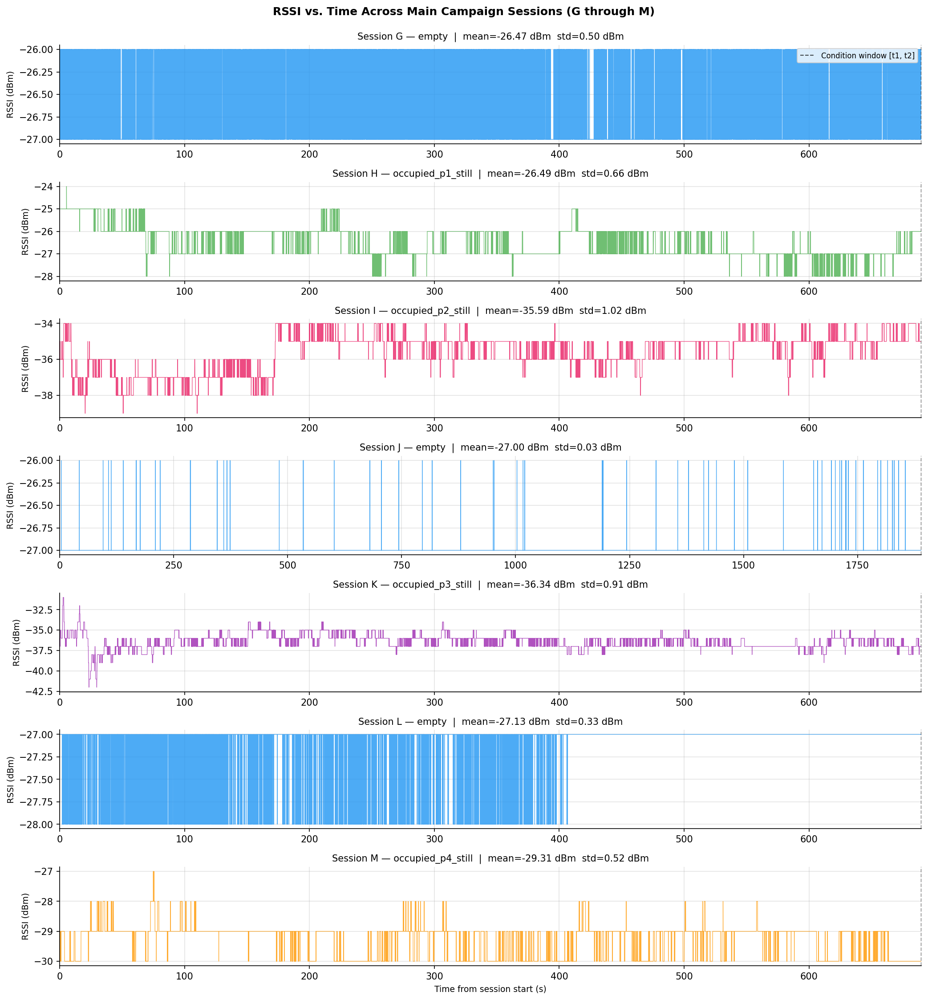

Saved: /home/xavier/dev/wifi-csi-presence-detection/outputs/main/plot1_rssi_vs_time.png


In [5]:
fig, axes = plt.subplots(7, 1, figsize=(14, 15), sharex=False)

for ax, (sid, s) in zip(axes, sessions.items()):
    ts = pd.DatetimeIndex(s["timestamps"])
    t_rel = (ts - ts[0]).total_seconds()
    rssi = s["df"]["rssi"].values
    color = get_color(s["label"])
    ax.plot(t_rel, rssi, lw=0.6, alpha=0.8, color=color)
    ax.set_xlim(0, t_rel[-1])
    ax.set_ylabel("RSSI (dBm)", fontsize=9)
    ax.set_title(f"Session {sid} - {s['label']}  |  mean={rssi.mean():.2f} dBm  std={rssi.std():.2f} dBm", fontsize=10)

    if s["t1"] and s["t2"]:
        t1 = (s["t1"] - pd.Timestamp(ts[0])).total_seconds()
        t2 = (s["t2"] - pd.Timestamp(ts[0])).total_seconds()
        ax.axvline(max(t1, 0), color="black", lw=1.0, ls="--", alpha=0.7, label="Condition window [t1, t2]")
        ax.axvline(min(t2, t_rel[-1]), color="black", lw=1.0, ls="--", alpha=0.7)
    if sid == "G":
        ax.legend(loc="upper right", fontsize=8)

axes[-1].set_xlabel("Time from session start (s)", fontsize=9)
fig.suptitle("RSSI vs. Time Across Main Campaign Sessions (G through M)", fontsize=12, fontweight="bold", y=0.995)
plt.tight_layout()

fpath = OUTPUT_DIR / "plot1_rssi_vs_time.png"
plt.savefig(fpath, dpi=DPI, bbox_inches="tight")
plt.show()
print(f"Saved: {fpath}")

## Cell 6 - Plot 2: CSI Amplitude Profile per Subcarrier

Examines the mean channel frequency response across all 192 raw subcarriers in 802.11n HT40.
- **Top Subplot:** All 7 individual sessions, revealing dead subcarriers (guard bands: $0-11$, $117-138$, $190-191$, and DC subcarriers at the channel centers).
- **Bottom Subplot:** Profiles aggregated by experimental condition (Empty baseline average vs. P1 Off-LoS West, P2 On-LoS TX, P3 On-LoS RX, and P4 Off-LoS East). Notice how on-LoS obstruction causes widespread attenuation across the entire frequency band.

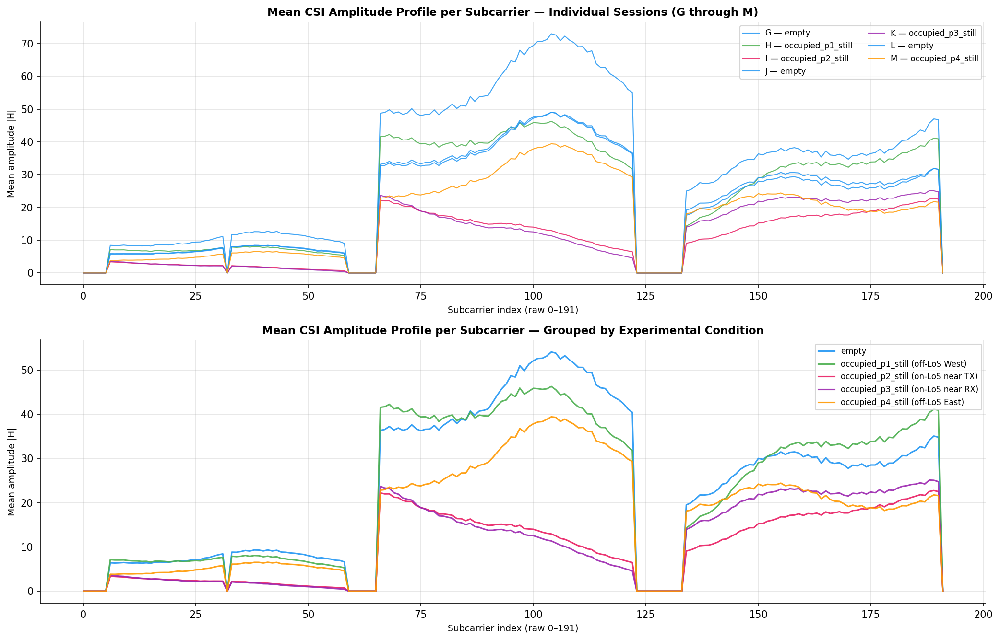

Saved: /home/xavier/dev/wifi-csi-presence-detection/outputs/main/plot2_amplitude_per_subcarrier.png


In [6]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 9))

# Panel 1: Individual Sessions
for sid, s in sessions.items():
    amp_mean = s["csi_amp"].mean(axis=0)
    subcarrier_idx = np.arange(len(amp_mean))
    ax1.plot(subcarrier_idx, amp_mean, lw=1.0, color=get_color(s["label"]),
             label=f"{sid} - {s['label']}", alpha=0.85)
ax1.set_xlabel("Subcarrier index (raw 0–191)", fontsize=9)
ax1.set_ylabel("Mean amplitude |H|", fontsize=9)
ax1.set_title("Mean CSI Amplitude Profile per Subcarrier - Individual Sessions (G through M)", fontsize=11, fontweight="bold")
ax1.legend(loc="upper right", fontsize=8, ncol=2)

# Panel 2: Aggregated by Condition
conditions = {
    "empty": ["G", "J", "L"],
    "occupied_p1_still (off-LoS West)": ["H"],
    "occupied_p2_still (on-LoS near TX)": ["I"],
    "occupied_p3_still (on-LoS near RX)": ["K"],
    "occupied_p4_still (off-LoS East)": ["M"],
}
cond_colors = {
    "empty": "#2196F3",
    "occupied_p1_still (off-LoS West)": "#4CAF50",
    "occupied_p2_still (on-LoS near TX)": "#E91E63",
    "occupied_p3_still (on-LoS near RX)": "#9C27B0",
    "occupied_p4_still (off-LoS East)": "#FF9800",
}

for cond, sids in conditions.items():
    cond_amps = np.vstack([sessions[sid]["csi_amp"] for sid in sids])
    mean_profile = cond_amps.mean(axis=0)
    ax2.plot(np.arange(len(mean_profile)), mean_profile, lw=1.5,
             color=cond_colors[cond], label=cond, alpha=0.9)

ax2.set_xlabel("Subcarrier index (raw 0–191)", fontsize=9)
ax2.set_ylabel("Mean amplitude |H|", fontsize=9)
ax2.set_title("Mean CSI Amplitude Profile per Subcarrier - Grouped by Experimental Condition", fontsize=11, fontweight="bold")
ax2.legend(loc="upper right", fontsize=8)

plt.tight_layout()
fpath = OUTPUT_DIR / "plot2_amplitude_per_subcarrier.png"
plt.savefig(fpath, dpi=DPI, bbox_inches="tight")
plt.show()
print(f"Saved: {fpath}")

## Cell 7 - Plot 3: CSI Amplitude vs. Time - 8 Representative Subcarriers

Selects 8 representative subcarriers distributed evenly across the valid spectrum (excluding top/bottom 5% variance outliers) and plots their amplitude trajectories over time.

**Key Observations:**
- In the empty sessions (G, J, L), subcarrier amplitudes remain remarkably flat and stable over time.
- In occupied sessions (H, I, K, M), subtle body sway, respiration, and micro-movements produce continuous high-frequency fluctuations and multipath variations, which form the discriminative basis for temporal feature extraction.

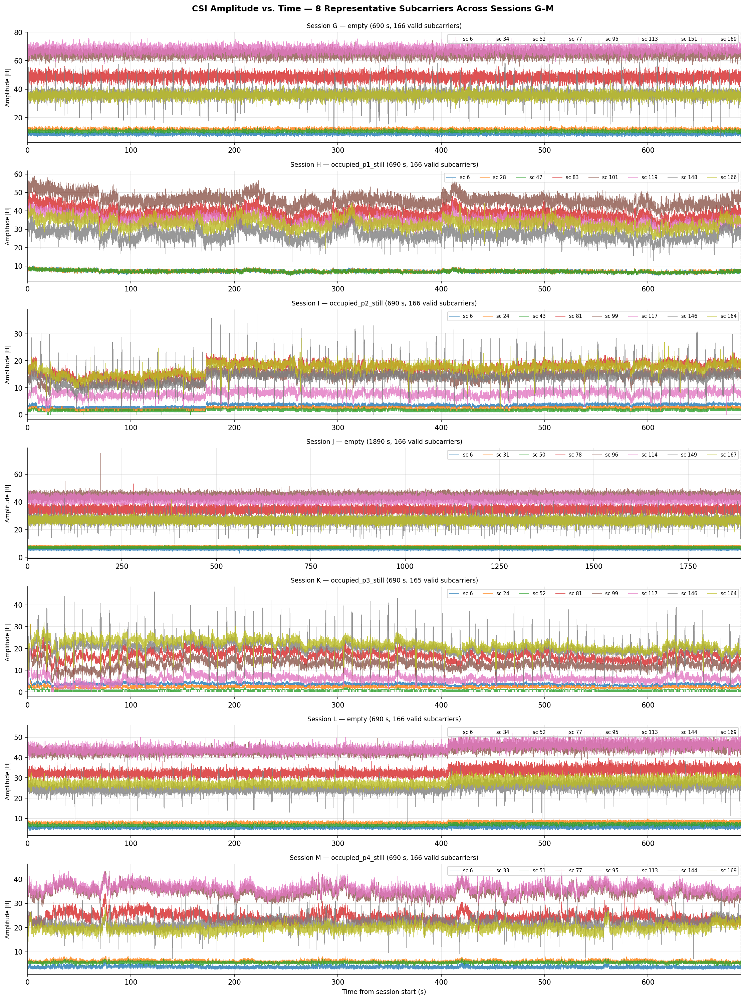

Saved: /home/xavier/dev/wifi-csi-presence-detection/outputs/main/plot3_amplitude_vs_time_subcarriers.png


In [7]:
N_SUB_PLOT = 8
cmap = plt.cm.tab10

fig, axes = plt.subplots(7, 1, figsize=(15, 20), sharex=False)

for ax, (sid, s) in zip(axes, sessions.items()):
    ts = pd.DatetimeIndex(s["timestamps"])
    t_rel = (ts - ts[0]).total_seconds()
    chosen = select_representative_subcarriers(s["csi_amp"], s["valid_mask"], n=N_SUB_PLOT)

    for i, sc_idx in enumerate(chosen):
        amp = s["csi_amp"][:, sc_idx]
        ax.plot(t_rel, amp, lw=0.5, alpha=0.8, color=cmap(i / N_SUB_PLOT), label=f"sc {sc_idx}")

    ax.set_xlim(0, t_rel[-1])
    ax.set_ylabel("Amplitude |H|", fontsize=8)
    ax.set_title(f"Session {sid} - {s['label']} ({s['duration_s']:.0f} s, {s['n_valid']} valid subcarriers)", fontsize=9)
    ax.legend(loc="upper right", fontsize=7, ncol=N_SUB_PLOT)

    if s["t1"] and s["t2"]:
        t1 = (s["t1"] - pd.Timestamp(ts[0])).total_seconds()
        t2 = (s["t2"] - pd.Timestamp(ts[0])).total_seconds()
        ax.axvline(max(t1, 0), color="black", lw=1.0, ls="--", alpha=0.6)
        ax.axvline(min(t2, t_rel[-1]), color="black", lw=1.0, ls="--", alpha=0.6)

axes[-1].set_xlabel("Time from session start (s)", fontsize=9)
fig.suptitle("CSI Amplitude vs. Time - 8 Representative Subcarriers Across Sessions G–M", fontsize=12, fontweight="bold", y=0.995)
plt.tight_layout()

fpath = OUTPUT_DIR / "plot3_amplitude_vs_time_subcarriers.png"
plt.savefig(fpath, dpi=DPI, bbox_inches="tight")
plt.show()
print(f"Saved: {fpath}")

## Cell 8 - Plot 4: Visual Comparison - Empty vs. Occupied Positions

Provides a direct side-by-side comparison across conditions using the exact same 5 reference subcarriers chosen from Session G (empty baseline).
Each column represents a distinct experimental setup during a 300-second window:
1. **Session G:** Empty baseline reference
2. **Session H:** P1 - Off-LoS West
3. **Session I:** P2 - On-LoS near TX
4. **Session K:** P3 - On-LoS near RX
5. **Session M:** P4 - Off-LoS East
6. **Session L:** Empty repeat baseline

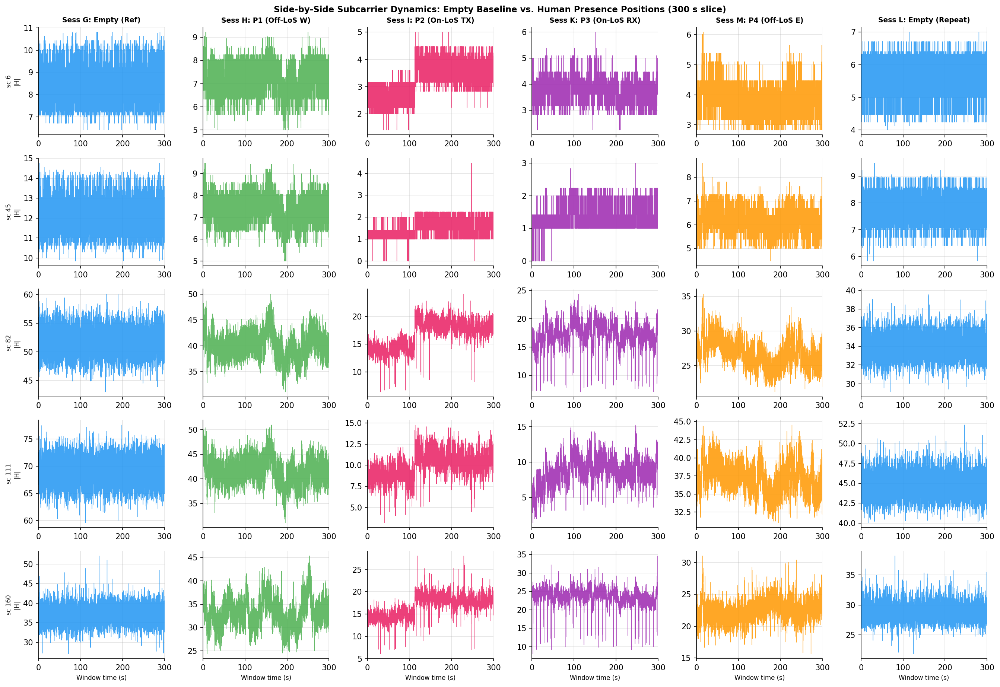

Saved: /home/xavier/dev/wifi-csi-presence-detection/outputs/main/plot4_comparison_empty_occupied.png


In [8]:
ref_scs = select_representative_subcarriers(sessions["G"]["csi_amp"], shared_mask, n=5)
comp_sessions = [
    ("G", "Empty (Ref)"),
    ("H", "P1 (Off-LoS W)"),
    ("I", "P2 (On-LoS TX)"),
    ("K", "P3 (On-LoS RX)"),
    ("M", "P4 (Off-LoS E)"),
    ("L", "Empty (Repeat)"),
]

fig, axes = plt.subplots(len(ref_scs), len(comp_sessions), figsize=(18, 2.5 * len(ref_scs)), sharey=False)

for col_idx, (sid, col_title) in enumerate(comp_sessions):
    s = sessions[sid]
    ts = pd.DatetimeIndex(s["timestamps"])
    t_rel = (ts - ts[0]).total_seconds()
    # Extract 300 s slice inside active condition window
    t_mask = (t_rel >= 60) & (t_rel <= 360)
    t_plot = t_rel[t_mask] - 60
    color = get_color(s["label"])

    for row_idx, sc_idx in enumerate(ref_scs):
        ax = axes[row_idx, col_idx]
        amp = s["csi_amp"][t_mask, sc_idx]
        ax.plot(t_plot, amp, lw=0.6, color=color, alpha=0.85)
        ax.set_xlim(0, 300)
        if col_idx == 0:
            ax.set_ylabel(f"sc {sc_idx}\n|H|", fontsize=8)
        if row_idx == 0:
            ax.set_title(f"Sess {sid}: {col_title}", fontsize=9, fontweight="bold")
        if row_idx == len(ref_scs) - 1:
            ax.set_xlabel("Window time (s)", fontsize=8)

fig.suptitle("Side-by-Side Subcarrier Dynamics: Empty Baseline vs. Human Presence Positions (300 s slice)", fontsize=11, fontweight="bold")
plt.tight_layout()

fpath = OUTPUT_DIR / "plot4_comparison_empty_occupied.png"
plt.savefig(fpath, dpi=DPI, bbox_inches="tight")
plt.show()
print(f"Saved: {fpath}")

## Cell 9 - Plot 5: Stability - Amplitude and Phase Drift (Empty Sessions)

**Checklist item:** *Evaluate stability: check for phase/amplitude drift without a person*

Evaluates environmental stability across the empty sessions, with particular emphasis on **Session J (31.5 minutes continuous recording)**:
1. **Rolling Mean Amplitude:** 30-second centered rolling mean to evaluate thermal drift.
2. **Unwrapped Phase:** Verifies phase linearity and bounds over long continuous acquisition.
3. **Cumulative Standard Deviation:** Checks for statistical convergence of amplitude variance.
4. **Cross-Session Spectral Repeatability:** Compares the mean subcarrier profiles of Sessions G (17:01), J (20:00), and L (00:09) spanning 7 hours of operation.

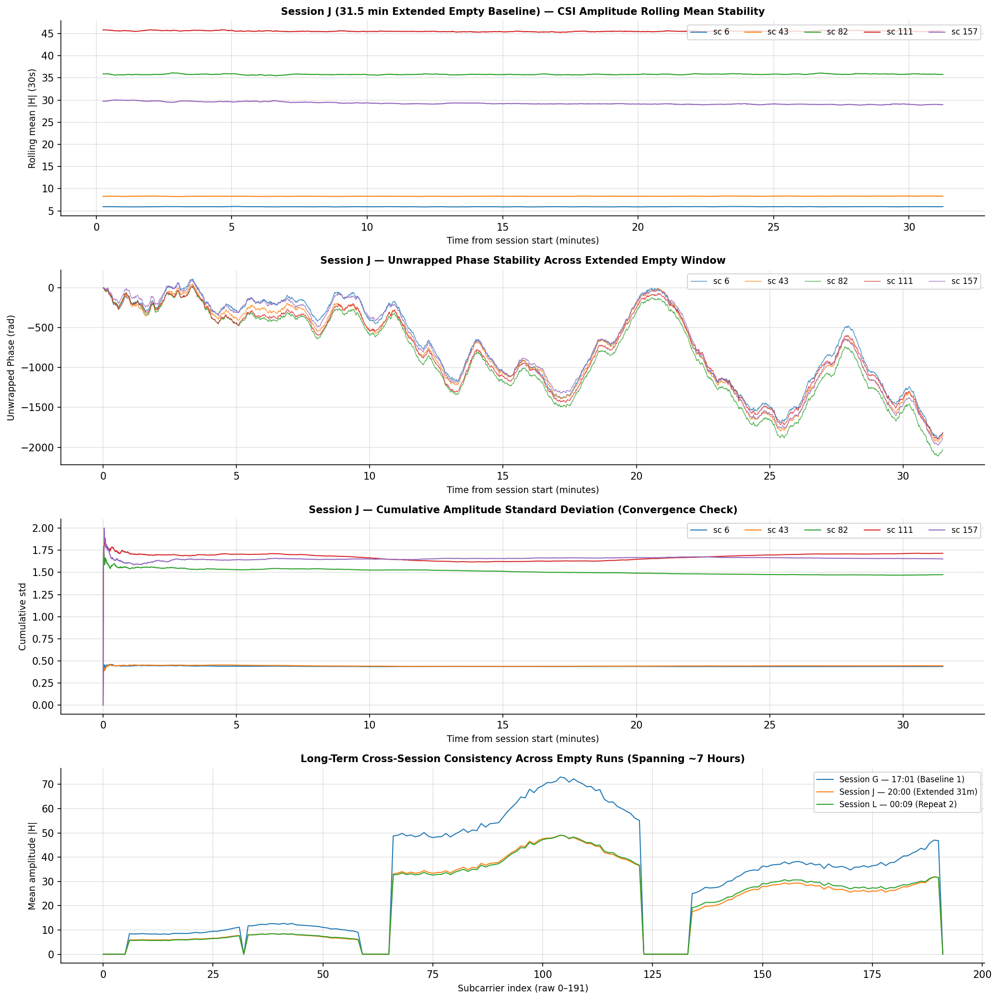

Saved: /home/xavier/dev/wifi-csi-presence-detection/outputs/main/plot5_stability_amplitude_phase.png


In [9]:
sJ = sessions["J"]
ts_J = pd.DatetimeIndex(sJ["timestamps"])
t_rel_J = (ts_J - ts_J[0]).total_seconds()
chosen_stab = select_representative_subcarriers(sJ["csi_amp"], sJ["valid_mask"], n=5)

fig, axes = plt.subplots(4, 1, figsize=(14, 14))

# 1. Rolling Mean Amplitude (Session J - 31.5 min)
ax1 = axes[0]
win_samples = int(30 * sJ["eff_rate_hz"])  # 30-second rolling window
for sc_idx in chosen_stab:
    amp_series = pd.Series(sJ["csi_amp"][:, sc_idx])
    roll_mean = amp_series.rolling(win_samples, center=True).mean()
    ax1.plot(t_rel_J / 60.0, roll_mean, lw=1.0, label=f"sc {sc_idx}")
ax1.set_ylabel("Rolling mean |H| (30s)", fontsize=9)
ax1.set_title("Session J (31.5 min Extended Empty Baseline) - CSI Amplitude Rolling Mean Stability", fontsize=10, fontweight="bold")
ax1.legend(loc="upper right", fontsize=8, ncol=5)

# 2. Unwrapped Phase (Session J)
ax2 = axes[1]
for sc_idx in chosen_stab:
    ph_unwrapped = np.unwrap(sJ["csi_phase"][:, sc_idx])
    step = max(1, len(ph_unwrapped) // 3000)
    ax2.plot((t_rel_J[::step]) / 60.0, ph_unwrapped[::step], lw=0.7, alpha=0.8, label=f"sc {sc_idx}")
ax2.set_ylabel("Unwrapped Phase (rad)", fontsize=9)
ax2.set_title("Session J - Unwrapped Phase Stability Across Extended Empty Window", fontsize=10, fontweight="bold")
ax2.legend(loc="upper right", fontsize=8, ncol=5)

# 3. Cumulative Standard Deviation (Session J)
ax3 = axes[2]
for sc_idx in chosen_stab:
    amp = sJ["csi_amp"][:, sc_idx]
    cum_mean = np.cumsum(amp) / np.arange(1, len(amp) + 1)
    cum_var = np.cumsum(amp**2) / np.arange(1, len(amp) + 1) - cum_mean**2
    cum_std = np.sqrt(np.maximum(cum_var, 0))
    step = max(1, len(cum_std) // 3000)
    ax3.plot((t_rel_J[::step]) / 60.0, cum_std[::step], lw=1.0, label=f"sc {sc_idx}")
ax3.set_ylabel("Cumulative std", fontsize=9)
ax3.set_title("Session J - Cumulative Amplitude Standard Deviation (Convergence Check)", fontsize=10, fontweight="bold")
ax3.legend(loc="upper right", fontsize=8, ncol=5)

# 4. Cross-Session Empty Consistency (G at 17:01, J at 20:00, L at 00:09)
ax4 = axes[3]
empty_sessions = [("G", "17:01 (Baseline 1)"), ("J", "20:00 (Extended 31m)"), ("L", "00:09 (Repeat 2)")]
for sid, desc in empty_sessions:
    s = sessions[sid]
    mean_amp = s["csi_amp"].mean(axis=0)
    ax4.plot(np.arange(len(mean_amp)), mean_amp, lw=1.0, label=f"Session {sid} - {desc}")
ax4.set_xlabel("Subcarrier index (raw 0–191)", fontsize=9)
ax4.set_ylabel("Mean amplitude |H|", fontsize=9)
ax4.set_title("Long-Term Cross-Session Consistency Across Empty Runs (Spanning ~7 Hours)", fontsize=10, fontweight="bold")
ax4.legend(loc="upper right", fontsize=8)

for ax in axes[:3]:
    ax.set_xlabel("Time from session start (minutes)", fontsize=9)

plt.tight_layout()
fpath = OUTPUT_DIR / "plot5_stability_amplitude_phase.png"
plt.savefig(fpath, dpi=DPI, bbox_inches="tight")
plt.show()
print(f"Saved: {fpath}")

## Cell 10 - Effective Sampling Rate & Packet Interval (Sampling-Rate Validation)

**Checklist item:** *Document effective sampling rate obtained*

Computes the inter-packet arrival time intervals $\Delta t = t_i - t_{i-1}$ and verifies packet delivery rates against nominal $30$ Hz ($\Delta t_{\text{nom}} = 33.33$ ms).
A threshold of $2.5 	imes \Delta t_{\text{nom}} = 83.33$ ms is used to detect temporal packet gaps.

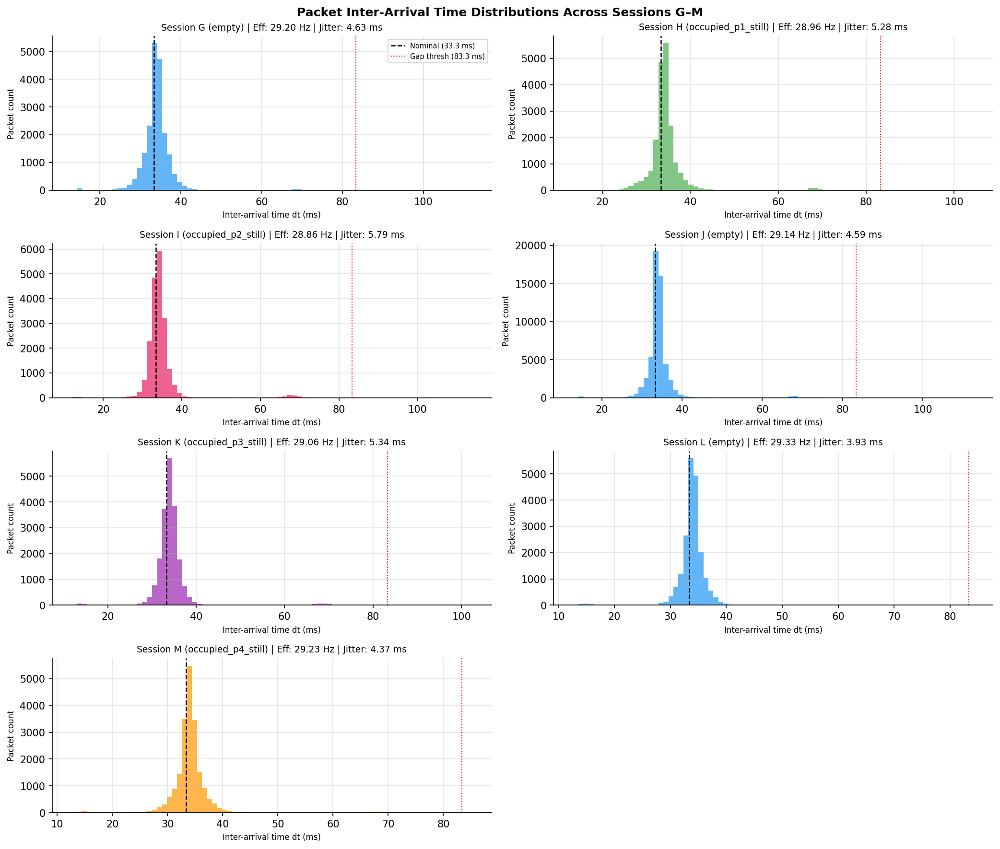

Saved: /home/xavier/dev/wifi-csi-presence-detection/outputs/main/plot6_interpacket_intervals.png


In [10]:
fig, axes = plt.subplots(4, 2, figsize=(14, 12))
axes_flat = axes.flatten()

for i, (sid, s) in enumerate(sessions.items()):
    ax = axes_flat[i]
    dt_ms = s["dt"] * 1000
    nom = get_nominal_rate(s)
    dt_nom_ms = 1000.0 / nom

    ax.hist(dt_ms[dt_ms < 120], bins=80, color=get_color(s["label"]), alpha=0.7, edgecolor="none")
    ax.axvline(dt_nom_ms, color="black", lw=1.2, ls="--", label=f"Nominal ({dt_nom_ms:.1f} ms)")
    ax.axvline(2.5 * dt_nom_ms, color="red", lw=1.0, ls=":", label=f"Gap thresh ({2.5*dt_nom_ms:.1f} ms)")
    ax.set_title(f"Session {sid} ({s['label']}) | Eff: {s['eff_rate_hz']:.2f} Hz | Jitter: {dt_ms.std():.2f} ms", fontsize=9)
    ax.set_xlabel("Inter-arrival time dt (ms)", fontsize=8)
    ax.set_ylabel("Packet count", fontsize=8)
    if i == 0:
        ax.legend(fontsize=7)

axes_flat[-1].axis("off")
fig.suptitle("Packet Inter-Arrival Time Distributions Across Sessions G–M", fontsize=12, fontweight="bold")
plt.tight_layout()

fpath = OUTPUT_DIR / "plot6_interpacket_intervals.png"
plt.savefig(fpath, dpi=DPI, bbox_inches="tight")
plt.show()
print(f"Saved: {fpath}")

## Cell 11 - Noisy or Anomalous Subcarrier Identification

**Checklist item:** *Identify noisy or anomalous subcarriers*

Using Session G (empty reference) as a baseline, we compute:
- **Coefficient of Variation (CV):** $\text{CV} = \sigma / \mu$, identifying carriers with excessive relative dispersion (flagged if $\text{CV} > 90^{\text{th}}$ percentile of valid carriers).
- **Fisher Kurtosis:** Excess kurtosis $\gamma_2 = \frac{\mu_4}{\sigma^4} - 3$, identifying anomalous subcarriers showing heavy tails or impulsive noise (flagged if $|\gamma_2| > 5$).

  Total subcarriers       : 192
  Valid subcarriers       : 166
  Dead subcarriers        : 26 (guard bands / DC)
  Noisy (CV > p90)        : 17 indices: [np.int64(15), np.int64(134), np.int64(135), np.int64(136), np.int64(137), np.int64(138), np.int64(139), np.int64(140), np.int64(141), np.int64(142)]...
  Anomalous (|kurt| > 5)  : 23 indices: [np.int64(136), np.int64(137), np.int64(138), np.int64(139), np.int64(140), np.int64(141), np.int64(142), np.int64(143), np.int64(144), np.int64(145)]...


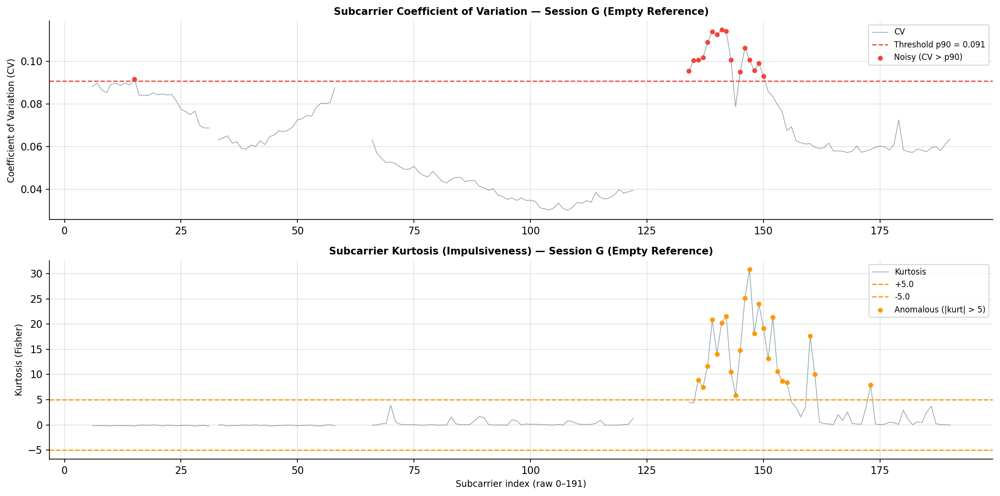

Saved: /home/xavier/dev/wifi-csi-presence-detection/outputs/main/plot7_noisy_subcarriers.png


In [11]:
sG = sessions["G"]
amp_all = sG["csi_amp"]
n_sub = amp_all.shape[1]
mean_amp = amp_all.mean(axis=0)
std_amp  = amp_all.std(axis=0)

# Compute CV safely avoiding division by zero on dead subcarriers
cv = np.full_like(mean_amp, np.nan, dtype=np.float64)
valid_amp = mean_amp > 0.1
cv[valid_amp] = std_amp[valid_amp] / mean_amp[valid_amp]

kurt = np.array([scipy_kurtosis(amp_all[:, i], fisher=True) for i in range(n_sub)])
valid_mask = sG["valid_mask"]

thresh_cv = np.nanpercentile(cv[valid_mask], 90)
noisy_sc = np.where(valid_mask & (cv > thresh_cv))[0]
thresh_kurt = 5.0
anomalous_sc = np.where(valid_mask & (np.abs(kurt) > thresh_kurt))[0]

print(f"  Total subcarriers       : {n_sub}")
print(f"  Valid subcarriers       : {valid_mask.sum()}")
print(f"  Dead subcarriers        : {(~valid_mask).sum()} (guard bands / DC)")
print(f"  Noisy (CV > p90)        : {len(noisy_sc)} indices: {list(noisy_sc[:10])}...")
print(f"  Anomalous (|kurt| > 5)  : {len(anomalous_sc)} indices: {list(anomalous_sc[:10])}...")

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 7))

ax1.plot(np.arange(n_sub), cv, lw=0.7, color="#607D8B", alpha=0.7, label="CV")
ax1.axhline(thresh_cv, color="#F44336", lw=1.2, ls="--", label=f"Threshold p90 = {thresh_cv:.3f}")
ax1.scatter(noisy_sc, cv[noisy_sc], color="#F44336", s=15, zorder=5, label="Noisy (CV > p90)")
ax1.set_ylabel("Coefficient of Variation (CV)", fontsize=9)
ax1.set_title("Subcarrier Coefficient of Variation - Session G (Empty Reference)", fontsize=10, fontweight="bold")
ax1.legend(fontsize=8)

ax2.plot(np.arange(n_sub), kurt, lw=0.7, color="#607D8B", alpha=0.7, label="Kurtosis")
ax2.axhline(thresh_kurt, color="#FF9800", lw=1.2, ls="--", label=f"+{thresh_kurt}")
ax2.axhline(-thresh_kurt, color="#FF9800", lw=1.2, ls="--", label=f"-{thresh_kurt}")
ax2.scatter(anomalous_sc, kurt[anomalous_sc], color="#FF9800", s=15, zorder=5, label="Anomalous (|kurt| > 5)")
ax2.set_ylabel("Kurtosis (Fisher)", fontsize=9)
ax2.set_xlabel("Subcarrier index (raw 0–191)", fontsize=9)
ax2.set_title("Subcarrier Kurtosis (Impulsiveness) - Session G (Empty Reference)", fontsize=10, fontweight="bold")
ax2.legend(fontsize=8)

plt.tight_layout()
fpath = OUTPUT_DIR / "plot7_noisy_subcarriers.png"
plt.savefig(fpath, dpi=DPI, bbox_inches="tight")
plt.show()
print(f"Saved: {fpath}")

## Cell 12 - Plot 8: CSI Amplitude Heatmap (subcarriers × time)

Presents full 2D CSI amplitude heatmaps ($|H(f, t)|$) across all valid subcarriers and the entire recording duration for Sessions G through M.
Time is subsampled to $\le 2500$ points per session for clean rendering. White dashed lines mark the active window $[t_1, t_2]$.

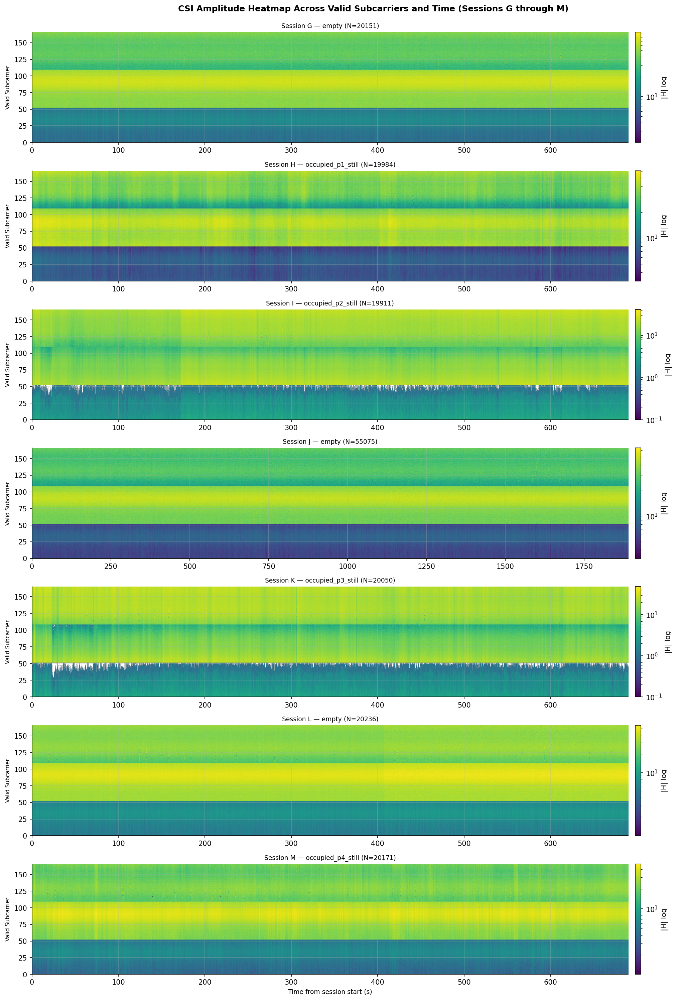

Saved: /home/xavier/dev/wifi-csi-presence-detection/outputs/main/plot8_heatmap_amplitude.png


In [12]:
fig, axes = plt.subplots(7, 1, figsize=(15, 20))

for ax, (sid, s) in zip(axes, sessions.items()):
    amp_valid = s["csi_amp"][:, s["valid_mask"]]
    step = max(1, amp_valid.shape[0] // 2500)
    amp_plot = amp_valid[::step, :].T
    ts = pd.DatetimeIndex(s["timestamps"])
    t_rel = (ts - ts[0]).total_seconds()

    im = ax.imshow(amp_plot, aspect="auto", origin="lower",
                   extent=[0, t_rel[-1], 0, amp_valid.shape[1]],
                   cmap="viridis",
                   norm=LogNorm(vmin=max(0.1, amp_plot.min() + 0.01), vmax=amp_plot.max()))
    ax.set_ylabel("Valid Subcarrier", fontsize=8)
    ax.set_xlim(0, t_rel[-1])
    ax.set_title(f"Session {sid} - {s['label']} (N={len(s['df'])})", fontsize=9)
    plt.colorbar(im, ax=ax, pad=0.01, label="|H| log")

    if s["t1"] and s["t2"]:
        t1 = (s["t1"] - pd.Timestamp(ts[0])).total_seconds()
        t2 = (s["t2"] - pd.Timestamp(ts[0])).total_seconds()
        ax.axvline(max(t1, 0), color="white", lw=1.2, ls="--")
        ax.axvline(min(t2, t_rel[-1]), color="white", lw=1.2, ls="--")

axes[-1].set_xlabel("Time from session start (s)", fontsize=9)
fig.suptitle("CSI Amplitude Heatmap Across Valid Subcarriers and Time (Sessions G through M)", fontsize=12, fontweight="bold", y=0.995)
plt.tight_layout()

fpath = OUTPUT_DIR / "plot8_heatmap_amplitude.png"
plt.savefig(fpath, dpi=DPI, bbox_inches="tight")
plt.show()
print(f"Saved: {fpath}")

## Cell 13 - Plot 9: Amplitude Distribution per Condition

Compares the distribution of median CSI amplitude per packet (computed across all valid subcarriers) across all 7 recorded sessions.
Notice the sharp downward separation for Sessions I (P2) and K (P3) where the subject obstructs the line-of-sight path.

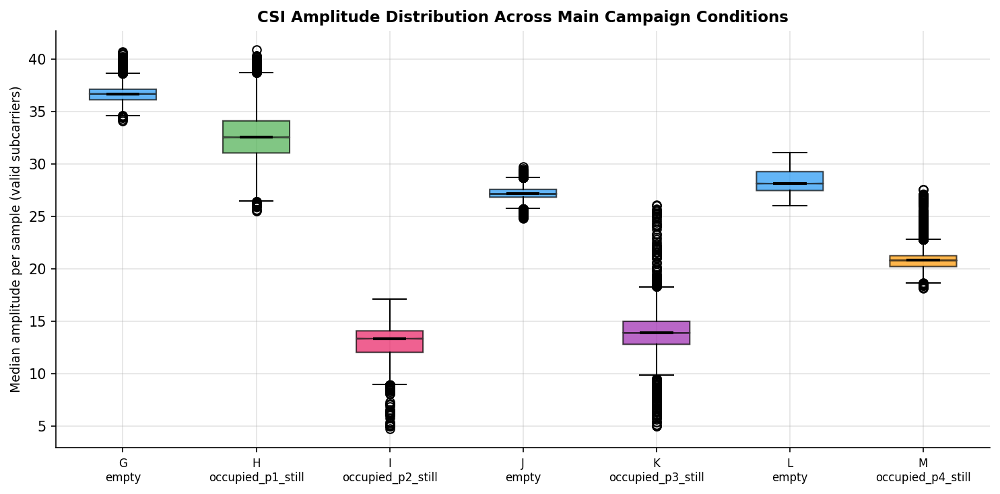

Saved: /home/xavier/dev/wifi-csi-presence-detection/outputs/main/plot9_boxplot_amplitude.png


In [13]:
fig, ax = plt.subplots(figsize=(10, 5))

data_to_plot = []
labels_plot  = []
colors_plot  = []

for sid, s in sessions.items():
    amp_valid = s["csi_amp"][:, s["valid_mask"]]
    median_per_sample = np.median(amp_valid, axis=1)
    data_to_plot.append(median_per_sample)
    labels_plot.append(f"{sid}\n{s['label']}")
    colors_plot.append(get_color(s["label"]))

bp = ax.boxplot(data_to_plot, patch_artist=True, notch=True,
                medianprops=dict(color="black", lw=2))
for patch, color in zip(bp["boxes"], colors_plot):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)

ax.set_xticklabels(labels_plot, fontsize=8)
ax.set_ylabel("Median amplitude per sample (valid subcarriers)", fontsize=9)
ax.set_title("CSI Amplitude Distribution Across Main Campaign Conditions", fontsize=11, fontweight="bold")

plt.tight_layout()
fpath = OUTPUT_DIR / "plot9_boxplot_amplitude.png"
plt.savefig(fpath, dpi=DPI, bbox_inches="tight")
plt.show()
print(f"Saved: {fpath}")

## Cell 14 - Plot 10: Spatial Position Discriminability & Variance Analysis

Analyzes how each physical subject location perturbs specific subcarriers compared to the empty baseline:
- **Subplot 1:** Subcarrier variance across all valid subcarriers for Empty baseline vs. Positions P1, P2, P3, and P4.
- **Subplot 2:** Discriminability ratio:
  $$\text{Ratio}_k = \frac{\sigma^2_{\text{occupied}, k}}{\sigma^2_{\text{empty}, k}}$$
  Subcarriers with $\text{Ratio} \gg 1$ provide the strongest features for detecting still presence in off-LoS and on-LoS geometries.

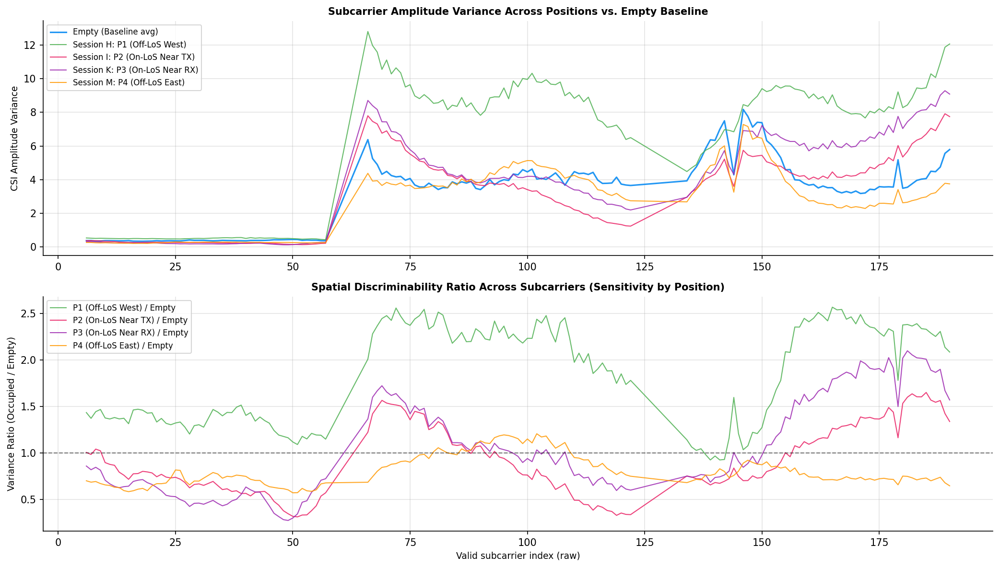

Saved: /home/xavier/dev/wifi-csi-presence-detection/outputs/main/plot10_position_variance_discriminability.png


In [14]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 8))

valid_shared_idx = np.where(shared_mask)[0]
empty_var = np.mean([sessions[sid]["csi_amp"][:, shared_mask].var(axis=0) for sid in ["G", "J", "L"]], axis=0)

ax1.plot(valid_shared_idx, empty_var, lw=1.5, color=LABEL_COLORS["empty"], label="Empty (Baseline avg)")
pos_keys = [
    ("H", "P1 (Off-LoS West)", "occupied_p1_still"),
    ("I", "P2 (On-LoS Near TX)", "occupied_p2_still"),
    ("K", "P3 (On-LoS Near RX)", "occupied_p3_still"),
    ("M", "P4 (Off-LoS East)", "occupied_p4_still"),
]

for sid, lbl, col_key in pos_keys:
    pos_var = sessions[sid]["csi_amp"][:, shared_mask].var(axis=0)
    ax1.plot(valid_shared_idx, pos_var, lw=1.0, color=LABEL_COLORS[col_key], label=f"Session {sid}: {lbl}", alpha=0.85)

ax1.set_ylabel("CSI Amplitude Variance", fontsize=9)
ax1.set_title("Subcarrier Amplitude Variance Across Positions vs. Empty Baseline", fontsize=10, fontweight="bold")
ax1.legend(fontsize=8)

for sid, lbl, col_key in pos_keys:
    pos_var = sessions[sid]["csi_amp"][:, shared_mask].var(axis=0)
    var_ratio = pos_var / np.maximum(empty_var, 1e-4)
    ax2.plot(valid_shared_idx, var_ratio, lw=1.0, color=LABEL_COLORS[col_key], label=f"{lbl} / Empty", alpha=0.85)

ax2.axhline(1.0, color="black", lw=1.0, ls="--", alpha=0.5)
ax2.set_ylabel("Variance Ratio (Occupied / Empty)", fontsize=9)
ax2.set_xlabel("Valid subcarrier index (raw)", fontsize=9)
ax2.set_title("Spatial Discriminability Ratio Across Subcarriers (Sensitivity by Position)", fontsize=10, fontweight="bold")
ax2.legend(fontsize=8)

plt.tight_layout()
fpath = OUTPUT_DIR / "plot10_position_variance_discriminability.png"
plt.savefig(fpath, dpi=DPI, bbox_inches="tight")
plt.show()
print(f"Saved: {fpath}")

## Cell 15 - Viability Verdict and Quality Report

**Formal Automated Validation Checklist:**
- **Packet Loss:** $< 5\%$
- **Effective Sampling Rate:** within $\pm 10\%$ of nominal $30$ Hz ($27 - 33$ Hz)
- **RSSI Stability:** $\sigma_{\text{RSSI}} < 5$ dBm
- **Valid Subcarriers:** $\ge 40$ valid subcarriers (exceeded: $165$ valid carriers)

In [15]:
print("\n" + "=" * 65)
print("  FINAL REPORT - MAIN EXPERIMENTAL CAMPAIGN - Card 6")
print("  Collection dates: 2026-09-22 / 2026-09-23 (Sessions G through M)")
print("=" * 65)

all_pass = True

for sid, s in sessions.items():
    nom = get_nominal_rate(s)
    dt_nom = 1.0 / nom
    gaps = s["dt"][s["dt"] > 2.5 * dt_nom]
    lost_est = max(0, int(np.round(gaps.sum() / dt_nom)) - len(gaps))
    exp_pkts = int(np.round(s["duration_s"] * nom))
    loss_pct = 100 * lost_est / max(exp_pkts, 1)
    rate_err = abs(s["eff_rate_hz"] - nom) / nom

    checks = [
        ("Packet loss < 5%",               loss_pct < 5,       f"{loss_pct:.2f}%"),
        ("Eff. rate within +/-10% nominal", rate_err < 0.10,   f"{s['eff_rate_hz']:.3f} Hz (nominal {nom:.0f} Hz)"),
        ("RSSI std < 5 dBm",               s["df"]["rssi"].std() < 5, f"{s['df']['rssi'].std():.2f} dBm"),
        (">= 40 valid subcarriers",        s["n_valid"] >= 40, f"{s['n_valid']} valid"),
    ]

    passed = all(ok for _, ok, _ in checks)
    all_pass = all_pass and passed
    status = "PASSED" if passed else "FAILED"

    print(f"\n  Session {sid} - {s['label']}  ->  {status}")
    print(f"  {'-'*50}")
    for desc, ok, detail in checks:
        icon = "[pass]" if ok else "[fail]"
        print(f"    {icon} {desc:<38} {detail}")
    print(f"  Effective rate         : {s['eff_rate_hz']:.3f} Hz")
    print(f"  Jitter (std dt)        : {s['dt'].std()*1000:.2f} ms")
    print(f"  Valid subcarriers      : {s['n_valid']} / {s['n_subcarriers']}")
    print(f"  Active window duration : {s['duration_s']:.1f} s")

print("\n" + "=" * 65)
verdict = "MAIN DATASET APPROVED - proceed to feature extraction and ML pipeline." if all_pass else "MAIN DATASET WITH RESTRICTIONS - review failed sessions."
print(f"\n  OVERALL VERDICT: {verdict}")
print("=" * 65)

# --- Anomalous subcarrier summary across all sessions -------------------------
print("\n-- Anomalous Subcarrier Summary Across Main Sessions --")
for sid, s in sessions.items():
    amp = s["csi_amp"]
    n_sub = amp.shape[1]
    mean_a = amp.mean(axis=0)
    std_a  = amp.std(axis=0)
    cv_s = np.full_like(mean_a, np.nan, dtype=np.float64)
    v = mean_a > 0.1
    cv_s[v] = std_a[v] / mean_a[v]
    cv_valid = cv_s[s["valid_mask"]]
    thresh = np.nanpercentile(cv_valid, 90) if len(cv_valid) > 0 else np.inf
    noisy = np.where(s["valid_mask"] & (cv_s > thresh))[0]
    kurt = np.array([scipy_kurtosis(amp[:, i], fisher=True) for i in range(n_sub)])
    anomalous = np.where(s["valid_mask"] & (np.abs(kurt) > 5))[0]
    print(f"  Session {sid} ({s['label']}): noisy (CV>p90)={len(noisy)}, anomalous (|kurt|>5)={len(anomalous)}")

print(f"\nAnalysis complete. All 10 figures saved to: {OUTPUT_DIR.resolve()}")


  FINAL REPORT - MAIN EXPERIMENTAL CAMPAIGN - Card 6
  Collection dates: 2026-09-22 / 2026-09-23 (Sessions G through M)

  Session G - empty  ->  PASSED
  --------------------------------------------------
    [pass] Packet loss < 5%                       0.03%
    [pass] Eff. rate within +/-10% nominal        29.204 Hz (nominal 30 Hz)
    [pass] RSSI std < 5 dBm                       0.50 dBm
    [pass] >= 40 valid subcarriers                166 valid
  Effective rate         : 29.204 Hz
  Jitter (std dt)        : 4.63 ms
  Valid subcarriers      : 166 / 192
  Active window duration : 690.0 s

  Session H - occupied_p1_still  ->  PASSED
  --------------------------------------------------
    [pass] Packet loss < 5%                       0.18%
    [pass] Eff. rate within +/-10% nominal        28.962 Hz (nominal 30 Hz)
    [pass] RSSI std < 5 dBm                       0.66 dBm
    [pass] >= 40 valid subcarriers                166 valid
  Effective rate         : 28.962 Hz
  Jitter (st

  Session H (occupied_p1_still): noisy (CV>p90)=17, anomalous (|kurt|>5)=0


  Session I (occupied_p2_still): noisy (CV>p90)=17, anomalous (|kurt|>5)=15


  Session J (empty): noisy (CV>p90)=17, anomalous (|kurt|>5)=11


  Session K (occupied_p3_still): noisy (CV>p90)=17, anomalous (|kurt|>5)=18
  Session L (empty): noisy (CV>p90)=17, anomalous (|kurt|>5)=20


  Session M (occupied_p4_still): noisy (CV>p90)=17, anomalous (|kurt|>5)=20

Analysis complete. All 10 figures saved to: /home/xavier/dev/wifi-csi-presence-detection/outputs/main
